In [ ]:
import pandas as pd
import numpy as np
from sklearn.model_selection import train_test_split
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import f1_score, roc_auc_score
from sklearn.metrics import classification_report
from sklearn.preprocessing import StandardScaler
from sklearn.pipeline import Pipeline
from sklearn.metrics import f1_score, roc_auc_score, confusion_matrix, roc_curve
import matplotlib.pyplot as plt
from scipy.stats import skew, kurtosis
import requests
from sklearn.neighbors import KernelDensity
from scipy.signal import find_peaks
from sklearn.utils import resample
from sklearn.ensemble import RandomForestClassifier

# Lab 3

Мы выбрали Medical Appointments No-Show датасет https://data.mendeley.com/datasets/wm6w2fvkfj/1

Человек записывается к врачу, получает все указания и не появляется. Кого винить?

Описание колонок:
1. "Specialty": specialty that patient received the treatment;
2. "Appointment Time": appointment time scheduled;
3. "Gender": male or female gender of the patient;
4. "Appointment Date": appointment date scheduled;
5. "No-show": given whether the patient attended the scheduled appointment or not;
6. "No-show Reason": description of the reason why the patient did not attend the scheduled appointment;
7. "Disability”: the patient’s motor or intellectual disability;
8. "Date of Birth": the patient’s date of birth;
9. "Date of Entry into the Service": date of the patient’s first appointment at the CER;
10. "City": city where the patient resides;
11. "ICD": identifier of the patient’s disease;
12. "Appointment Month";
13. "Appointment Year";
14. "Appointment Shift";
15. "Age": patient's age;
16. "Under 12 years old": patient's age under 12 years old;
17. "Over 60 years old": patient's age over 60 years old;
18. "Patient needs companion": patient's needs companion to go to the appointment;
19. "Patient needs companion": patient's needs companion to go to the appointment;
20. "Average Temperatura Day": Average temperatura in the day of the appointment;
21. "Average Rain Day": Average rain in the day of the appointment;
22. "Max Temperature Day": Maximum temperature in the day of the appointment;
23. "Max Rain Day": Maximum rainfall in the day of the appointment;
24. "Storm Day Before": Heavy rain in the day before the appointment;
25. "Rain Intensity": no rain, weak, moderate or heavy rain in the day of the appointment;
26. "Heat Intensity": cold, heavy cold, warm, heavy warm or mild in the day of the appointment;

Our goal is to predict **No-show**

Взглянем на данные, типы и их общий внешний вид

In [ ]:
file_id = "1kQfRDlGIAh2QdbB7h4zeBgUKQuVHdADD"
url = f"https://drive.google.com/uc?export=download&id={file_id}"

output_path = "medical-appointments-no-show-en.csv"


In [ ]:
session = requests.Session()
response = session.get(url, stream=True)

def get_confirm_token(response):
    for key, value in response.cookies.items():
        if key.startswith("download_warning"):
            return value
    return None

token = get_confirm_token(response)
if token:
    url = f"https://drive.google.com/uc?export=download&id={file_id}&confirm={token}"
    response = session.get(url, stream=True)

with open(output_path, "wb") as f:
    for chunk in response.iter_content(32768):
        if chunk:
            f.write(chunk)

print("Downloaded:", output_path)

Downloaded: medical-appointments-no-show-en.csv


In [ ]:
df = pd.read_csv('medical-appointments-no-show-en.csv')

In [ ]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 49593 entries, 0 to 49592
Data columns (total 26 columns):
 #   Column                   Non-Null Count  Dtype  
---  ------                   --------------  -----  
 0   specialty                42139 non-null  object 
 1   appointment_time         49593 non-null  object 
 2   gender                   49593 non-null  object 
 3   appointment_date         49593 non-null  object 
 4   no_show                  49593 non-null  object 
 5   no_show_reason           1737 non-null   object 
 6   disability               44456 non-null  object 
 7   date_of_birth            39272 non-null  object 
 8   entry_service_date       44438 non-null  object 
 9   city                     44412 non-null  object 
 10  icd                      10717 non-null  object 
 11  appointment_month        49593 non-null  object 
 12  appointment_year         49593 non-null  int64  
 13  appointment_shift        49593 non-null  object 
 14  age                   

In [ ]:
df.dtypes

,0
specialty,object
appointment_time,object
gender,object
appointment_date,object
no_show,object
no_show_reason,object
disability,object
date_of_birth,object
entry_service_date,object
city,object


In [ ]:
df.head()

,specialty,appointment_time,gender,appointment_date,no_show,no_show_reason,disability,date_of_birth,entry_service_date,city,...,over_60_years_old,patient_needs_companion,average_temp_day,average_rain_day,max_temp_day,max_rain_day,rainy_day_before,storm_day_before,rain_intensity,heat_intensity
0,physiotherapy,13:20,M,09/09/2021,yes,surto,NaN,NaN,NaN,NaN,...,0,0,20.75,0.01,23.7,0.2,1,1,no_rain,mild
1,psychotherapy,13:20,M,09/09/2021,no,NaN,NaN,NaN,NaN,NaN,...,0,0,20.75,0.01,23.7,0.2,1,1,no_rain,mild
2,speech therapy,13:20,F,09/09/2021,no,NaN,NaN,NaN,NaN,NaN,...,0,0,20.75,0.01,23.7,0.2,1,1,no_rain,mild
3,physiotherapy,13:20,F,09/09/2021,no,NaN,NaN,NaN,NaN,NaN,...,0,0,20.75,0.01,23.7,0.2,1,1,no_rain,mild
4,physiotherapy,14:00,M,09/09/2021,no,NaN,motor,10/10/1954,5/2/2020,B. CAMBORIU,...,1,1,20.75,0.01,23.7,0.2,1,1,no_rain,mild


In [ ]:
df.dtypes

,0
specialty,object
appointment_time,object
gender,object
appointment_date,object
no_show,object
no_show_reason,object
disability,object
date_of_birth,object
entry_service_date,object
city,object


In [ ]:
for col in df.columns:
    print(f"Unique values in column '{col}':")
    print(df[col].unique())
    print("\n")

Unique values in column 'specialty':
['physiotherapy' 'psychotherapy' 'speech therapy' 'occupational therapy'
 nan 'enf' 'assist' 'pedagogo' 'sem especialidade']


Unique values in column 'appointment_time':
['13:20' '14:00' '14:40' '15:20' '16:20' '17:00' '17:40' '07:20' '08:00'
 '08:40' '10:20' '11:00' '11:40' '09:20' '13:00' '13:30' '16:40' '16:00'
 '15:00' '15:40' '08:50' '09:40' '10:50' '07:00' '09:30' '16:35' '13:50'
 '15:30' '18:15' '17:25' '14:50' '17:20' '08:20' '09:10' '10:30' '11:20'
 '07:30' '18:00' '07:50' '12:20' '14:20' '15:10' '17:10' '16:30' '11:10'
 '12:00' '08:30' '13:15' '15:50' '09:45' '10:35' '10:00' '09:50' '13:40'
 '13:05' '12:10' '09:00' '11:30' '13:10' '14:30' '16:15' '10:40' '16:10'
 '15:15' '10:10' '08:10' '18:20' '16:36' '17:36' '17:15' '14:10' '17:35'
 '16:50' '09:03']


Unique values in column 'gender':
['M' 'F' 'I']


Unique values in column 'appointment_date':
['09/09/2021' '09/09/2019' '09/08/2021' ... '01/07/2016' '01/03/2021'
 '01/02/2022']


Unique 

In [ ]:
# df["appointment_date"] = pd.to_datetime(df["appointment_date"], errors="coerce"). # later
df["date_of_birth"] = pd.to_datetime(df["date_of_birth"], errors="coerce")
df["entry_service_date"] = pd.to_datetime(df["entry_service_date"], errors="coerce")


Мы видим много NaN значение и других немного странных вещей, так как в датасете реальные данные. В целом, нам не нужны разные виды ID, так что извлечём несколько информативных предикторов

Несмотря на то, что датасет может быть интерпретируем как time series, мы будем упрощать, извлекая несколько признаков и полагаясь на них для предсказания

## Naive approach

In [ ]:
df_naive = df.copy()

In [ ]:
predictors = [
    "specialty",                   # x1 categorical (discrete), String
    "disability",                  # x2 categorical (discrete), String
    "appointment_month",           # x3 categorical (discrete), Int
    "under_12_years_old",          # x4 categorical (discrete), Int
    "age",                         # x5 continuous, Int
    "average_temp_day",            # x6 continuous, Int
    "average_rain_day",            # x7 continuous, Int
    "max_rain_day",                # x8 continuous, Int
    "max_temp_day",                # x9 continuous, Int
    "rainy_day_before",            # x10 categorical (discrete), Bool
    "storm_day_before",            # x11 categorical (discrete), Bool
    "rain_intensity",              # x12 categorical (discrete), String
    "heat_intensity",              # x13 categorical (discrete), String
    "appointment_shift",           # x14 categorical (discrete), String
    "gender",                      # x15 categorical (discrete), String
    "patient_needs_companion",     # x16 boolean/categorical, Bool
]

target_class = "no_show"   # binary class (logreg)

Сделаем минимальное количество работы для того, чтобы logreg взлетел. Кодируем категориальные признаки, NaNs воспримем как -1

In [ ]:
df_naive[target_class] = (
    df_naive[target_class]
    .astype(str)
    .str.strip()
    .str.lower()
    .map(lambda x: 1 if x in ["yes", "y", "sim", "true", "1"] else 0)
)

In [ ]:
num_cols = [
    "age",
    "average_temp_day",
    "average_rain_day",
    "max_rain_day",
    "max_temp_day"
]

for c in num_cols:
    df_naive[c] = pd.to_numeric(df_naive[c], errors="coerce").fillna(-999)

In [ ]:
cat_cols = [
    "specialty",
    "disability",
    "appointment_month",
    "rain_intensity",
    "heat_intensity",
    "appointment_shift",
    "gender"
]

for c in cat_cols:
    df_naive[c] = df_naive[c].astype(str).replace("nan", np.nan)
    df_naive[c], _ = pd.factorize(df_naive[c], use_na_sentinel=-1)

In [ ]:
bin_cols = [
    "under_12_years_old",
    "patient_needs_companion",
    "rainy_day_before",
    "storm_day_before"
]

for c in bin_cols:
    df_naive[c] = df_naive[c].fillna(-1).astype(int)

In [ ]:
X = df_naive[predictors]
y = df_naive[target_class]

X_train, X_test, y_train, y_test = train_test_split(
    X, y, test_size=0.2, random_state=42, stratify=y
)

In [ ]:
clf = LogisticRegression(max_iter=2000)
clf.fit(X_train, y_train)

y_pred = clf.predict(X_test)
y_proba = clf.predict_proba(X_test)[:, 1]

In [ ]:
f1 = f1_score(y_test, y_pred)
roc_auc = roc_auc_score(y_test, y_proba)

print("F1 score:", round(f1, 4))
print("ROC-AUC:", round(roc_auc, 4))

F1 score: 0.0
ROC-AUC: 0.5731


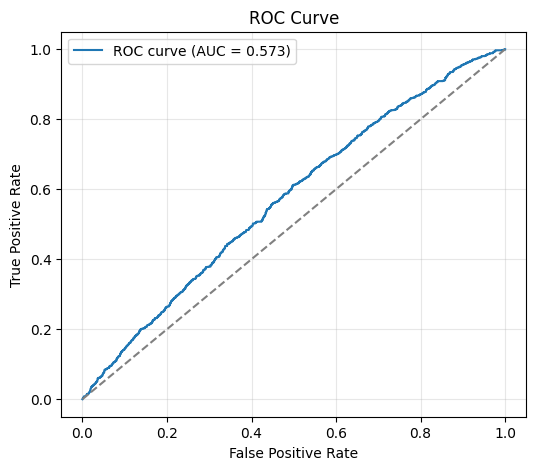

In [ ]:
fpr, tpr, thresholds = roc_curve(y_test, y_proba)

plt.figure(figsize=(6, 5))
plt.plot(fpr, tpr, label=f"ROC curve (AUC = {roc_auc:.3f})")
plt.plot([0, 1], [0, 1], linestyle="--", color="gray")
plt.xlabel("False Positive Rate")
plt.ylabel("True Positive Rate")
plt.title("ROC Curve")
plt.legend()
plt.grid(alpha=0.3)
plt.show()

Text(0, 0.5, 'Actual')

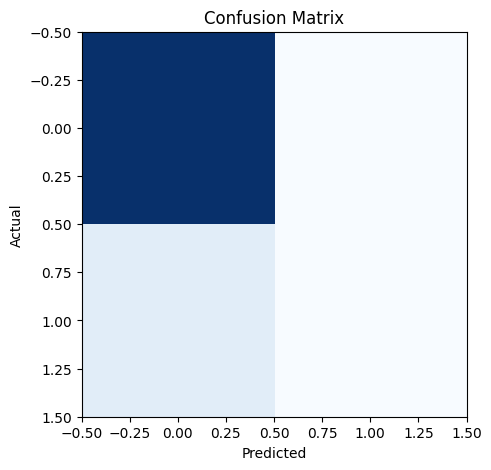

In [ ]:
cm = confusion_matrix(y_test, y_pred)

plt.figure(figsize=(5, 5))
plt.imshow(cm, cmap="Blues")
plt.title("Confusion Matrix")
plt.xlabel("Predicted")
plt.ylabel("Actual")

Сейчас предсказание очень близко к случайному, так что смиримся с этим. Вероятно, это из-за жуткого дисбаланса классов, пропусков и шумов

## Processing and analysis

### Visualization

In [ ]:
import numpy as np
import pandas as pd
import plotly.express as px

numeric_cols = ["age", "average_temp_day", "average_rain_day",
                "max_temp_day", "max_rain_day"]

binary_cols = ["under_12_years_old", "patient_needs_companion",
               "rainy_day_before", "storm_day_before"]

categorical_cols = ["specialty", "disability", "appointment_month",
                    "rain_intensity", "heat_intensity",
                    "appointment_shift", "gender"]

target = "no_show"

In [ ]:
import plotly.express as px

target = "no_show"

no_show_counts = (
    df[target]
    .value_counts()
    .reset_index(name="count")
    .rename(columns={"index": target})
)

fig = px.bar(
    no_show_counts,
    x=target,
    y="count",
    title="Распределение целевой переменной no_show",
    labels={target: "no_show (0 = пришёл, 1 = не пришёл)", "count": "Количество записей"}
)
fig.update_layout(xaxis_tickangle=0)
fig.show()


#### Описательные статистики по числовым и бинарным признакам

In [ ]:
def describe_numeric(df, cols):
    desc = df[cols].describe().T  # count, mean, std, min, 25%, 50%, 75%, max
    desc.rename(columns={'50%': 'median'}, inplace=True)

    desc['range'] = desc['max'] - desc['min']
    desc['missing'] = df[cols].isna().sum()
    desc['missing_pct'] = desc['missing'] / len(df) * 100
    desc['skew'] = df[cols].skew()
    desc['kurtosis'] = df[cols].kurtosis()  # эксцесс

    cols_order = [
        'count', 'missing', 'missing_pct',
        'mean', 'median', 'std', 'range',
        'min', '25%', '75%', 'max',
        'skew', 'kurtosis'
    ]
    return desc[cols_order].round(3)

numeric_stats = describe_numeric(df, numeric_cols)
numeric_stats

,count,missing,missing_pct,mean,median,std,range,min,25%,75%,max,skew,kurtosis
age,39243.0,10350,20.870,18.522,11.00,19.235,108.00,2.00,8.00,15.00,110.00,2.060,3.161
average_temp_day,48577.0,1016,2.049,19.748,20.06,3.429,19.07,8.94,17.48,22.12,28.01,-0.430,-0.117
average_rain_day,48577.0,1016,2.049,0.190,0.01,0.452,4.77,0.00,0.00,0.15,4.77,4.266,23.972
max_temp_day,48577.0,1016,2.049,23.962,23.90,3.820,22.10,13.30,21.40,26.50,35.40,0.005,-0.223
max_rain_day,48577.0,1016,2.049,1.896,0.20,4.445,45.00,0.00,0.00,1.60,45.00,4.463,27.348


* **age:** средний возраст 18.5 лет, при медиане 11 лет и размахе от 2 до 110 говорит о том, что средняя масса пациентов -- это дети и подростки, с длинным хвостом взрослых и пожилых пациентов, вплоть до экстремальных значений до 110 лет. Также в пользу длинного правого хвоста говорит сильная положительная асимметрия (skew). Положительный эксцесс указывает на более острую вершину распределения и тяжелые хвосты, по сравнению с нормальным распределением, то есть в сете есть много наблюдений вокруг среднего, но в то же время есть довольно экстремальные значения параметра, которые могут оказаться выбросами, так что требуется проверить качество данных. Пропусков много, примерно у каждого пятого пациента не заполнен возраст. Это критичный момент для модели: придётся либо аккуратно восстанавливать возраст, либо продумывать, как не потерять эти записи.

* average_temp и

Далее проанализируем и интерпретируем распределения параметров в датасете:

In [ ]:
def interpret_numeric_stats(stats_row, var_name):
    skew = stats_row['skew']
    kurt = stats_row['kurtosis']
    miss_pct = stats_row['missing_pct']

    comments = []

    if abs(skew) < 0.5:
        comments.append("распределение близко к симметричному")
    elif abs(skew) < 1:
        comments.append("умеренная асимметрия")
    else:
        direction = "правосторонняя (длинный правый хвост)" if skew > 0 else "левосторонняя (длинный левый хвост)"
        comments.append(f"распределение сильно асимметрично, {direction}")

    if kurt > 1:
        comments.append("остроконечное распределение с тяжёлыми хвостами (высокий риск выбросов)")
    elif kurt < -1:
        comments.append("плоскоконичное распределение с лёгкими хвостами")

    if miss_pct > 0:
        comments.append(f"есть пропуски: {miss_pct:.1f}% наблюдений")
    else:
        comments.append("пропусков нет")

    return f"Переменная '{var_name}': " + "; ".join(comments) + "."

for var_name, row in numeric_stats.iterrows():
    print(interpret_numeric_stats(row, var_name))

Переменная 'age': распределение сильно асимметрично, правосторонняя (длинный правый хвост); остроконечное распределение с тяжёлыми хвостами (высокий риск выбросов); есть пропуски: 20.9% наблюдений.
Переменная 'average_temp_day': распределение близко к симметричному; есть пропуски: 2.0% наблюдений.
Переменная 'average_rain_day': распределение сильно асимметрично, правосторонняя (длинный правый хвост); остроконечное распределение с тяжёлыми хвостами (высокий риск выбросов); есть пропуски: 2.0% наблюдений.
Переменная 'max_temp_day': распределение близко к симметричному; есть пропуски: 2.0% наблюдений.
Переменная 'max_rain_day': распределение сильно асимметрично, правосторонняя (длинный правый хвост); остроконечное распределение с тяжёлыми хвостами (высокий риск выбросов); есть пропуски: 2.0% наблюдений.


In [ ]:
binary_summary = []

for col in binary_cols:
    s = df[col]
    missing = s.isna().sum()
    miss_pct = missing / len(s) * 100
    p1 = s.mean()  # доля 1, если кодировка 0/1
    binary_summary.append({
        "variable": col,
        "n": len(s),
        "missing": missing,
        "missing_pct": round(miss_pct, 2),
        "share_of_1": round(p1, 3)
    })

binary_summary = pd.DataFrame(binary_summary)
binary_summary

,variable,n,missing,missing_pct,share_of_1
0,under_12_years_old,49593,0,0.0,0.472
1,patient_needs_companion,49593,0,0.0,0.544
2,rainy_day_before,49593,0,0.0,0.981
3,storm_day_before,49593,0,0.0,0.981


In [ ]:
for _, row in binary_summary.iterrows():
    v = row["variable"]
    p1 = row["share_of_1"]
    miss_pct = row["missing_pct"]
    balance_comment = (
        "классы относительно сбалансированы"
        if 0.3 <= p1 <= 0.7
        else "сильный дисбаланс классов"
    )
    miss_comment = (
        f"есть пропуски: {miss_pct:.1f}%" if miss_pct > 0
        else "пропусков нет"
    )
    print(f"Бинарная переменная '{v}': доля 1 = {p1:.3f}; {balance_comment}; {miss_comment}.")

Бинарная переменная 'under_12_years_old': доля 1 = 0.472; классы относительно сбалансированы; пропусков нет.
Бинарная переменная 'patient_needs_companion': доля 1 = 0.544; классы относительно сбалансированы; пропусков нет.
Бинарная переменная 'rainy_day_before': доля 1 = 0.981; сильный дисбаланс классов; пропусков нет.
Бинарная переменная 'storm_day_before': доля 1 = 0.981; сильный дисбаланс классов; пропусков нет.


In [ ]:
for col in numeric_cols:
    fig = px.histogram(
        df,
        x=col,
        nbins=30,
        marginal="box",
        opacity=0.75,
        title=f"Распределение {col}: гистограмма и boxplot"
    )
    fig.update_layout(
        bargap=0.05,
        xaxis_title=col,
        yaxis_title="Частота"
    )
    fig.show()


In [ ]:
for col in numeric_cols:
    fig = px.histogram(
        df,
        x=col,
        color=target,
        nbins=30,
        barmode="overlay",
        opacity=0.6,
        marginal="box",
        title=f"Распределение {col} по классам no_show"
    )
    fig.update_layout(
        bargap=0.05,
        xaxis_title=col,
        yaxis_title="Частота"
    )
    fig.show()

In [ ]:
from scipy.stats import gaussian_kde

for col in numeric_cols:
    s = df[col].dropna()
    if len(s) < 50:
        print(f"Переменная '{col}': слишком мало наблюдений для устойчивой KDE ({len(s)}).")
        continue

    kde = gaussian_kde(s)
    x_grid = np.linspace(s.min(), s.max(), 200)
    y_grid = kde(x_grid)

    fig = px.line(
        x=x_grid,
        y=y_grid,
        title=f"Оценка плотности (KDE) для {col}",
        labels={"x": col, "y": "Плотность"}
    )
    fig.show()

In [ ]:
for col in binary_cols:
    tmp = (
        df
        .groupby([col, target])
        .size()
        .reset_index(name='count')
    )

    fig = px.bar(
        tmp,
        x=col,
        y='count',
        color=target,
        barmode='group',
        title=f"{col} по классам no_show"
    )
    fig.show()

In [ ]:
for col in categorical_cols:
    tmp = (
        df
        .groupby([col, target])
        .size()
        .reset_index(name='count')
    )

    fig = px.bar(
        tmp,
        x=col,
        y='count',
        color=target,
        barmode='group',
        title=f"{col} по классам no_show"
    )
    fig.update_layout(xaxis_tickangle=-45)
    fig.show()

In [ ]:
cols_for_missing = numeric_cols + binary_cols

missing = (
    df[cols_for_missing]
    .isna()
    .mean()
    .reset_index()
)
missing.columns = ['variable', 'missing_pct']
missing['missing_pct'] *= 100

fig = px.bar(
    missing,
    x='variable',
    y='missing_pct',
    title='Доля пропусков по числовым и бинарным признакам',
    labels={'variable': 'Признак', 'missing_pct': 'Пропуски, %'}
)
fig.update_layout(xaxis_tickangle=-45)
fig.show()

### Missing values

Цель: определить пропущенные значения в каждой переменной. Выбрать подходящую стратегию для их обработки (например, заполнение, удаление) и обосновать свой выбор. Для этой цели можно использовать значения, взятые из одномерного распределения или подстановку с моментами (среднее, медиана) распределения.

Посмотрим на то, в каких признаках вообще наблюдаеются пропуски.
Предварительно создадим таблицу только тех признаков, которые мы выбираем в качестве предикторов.

Во-первых, сразу преобразуем пропуски или пробельные строки в nan для категориальных признаков

In [ ]:
for categoric_feature in categorical_cols + binary_cols:
    df[categoric_feature] = df[categoric_feature].replace(r'^\s*$', np.nan, regex=True)

In [ ]:
in_use_cols = numeric_cols + binary_cols + categorical_cols + ['appointment_date'] + ['no_show']
print(f'FEATURES IN USE: {in_use_cols}')
cleared_from_null_df = df[in_use_cols].copy()

FEATURES IN USE: ['age', 'average_temp_day', 'average_rain_day', 'max_temp_day', 'max_rain_day', 'under_12_years_old', 'patient_needs_companion', 'rainy_day_before', 'storm_day_before', 'specialty', 'disability', 'appointment_month', 'rain_intensity', 'heat_intensity', 'appointment_shift', 'gender', 'appointment_date', 'no_show']


In [ ]:
import pandas as pd
import plotly.express as px

def analyze_missing_values_by_column(df):
    total_rows = len(df)

    missing_analysis = pd.DataFrame({
        'column': df.columns,
        'missing_count': df.isnull().sum().values
    })

    missing_analysis['missing_percent'] = (missing_analysis['missing_count'] / total_rows * 100)
    missing_df = missing_analysis[missing_analysis['missing_count'] > 0].sort_values('missing_percent',
                                                                                     ascending=False)

    if len(missing_df) == 0:
        return "No more missing values!"

    print(missing_df)

    fig = px.bar(
        missing_df,
        x='column',
        y='missing_percent',
        title='Missing values percent by column',
        labels={'missing_percent': 'Missing values percent', 'column': 'columns'},
        color='missing_percent',
        color_continuous_scale='Reds'
    )
    fig.update_layout(
        xaxis_tickangle=-45,
        height=500,
        showlegend=False
    )
    fig.show()

analyze_missing_values_by_column(cleared_from_null_df)

              column  missing_count  missing_percent
0                age          10350        20.869881
9          specialty           7454        15.030347
10        disability           5146        10.376464
2   average_rain_day           1016         2.048676
1   average_temp_day           1016         2.048676
4       max_rain_day           1016         2.048676
3       max_temp_day           1016         2.048676


Будем придерживаться идеи, что нам важен каждый сэмпл и лучше заполнить пропуски, чем просто убрать эти записи.

На самом деле проще удалить 2 процента всех кортежей по признакам `average_rain_day`, `average_temp_day`, `max_rain_day`, `max_temp_day`, если в них содержатся пропуски значений, чем выстраивать стратегию заполнения.

...

20. "Average Temperatura Day": Average temperatura in the day of the appointment;
21. "Average Rain Day": Average rain in the day of the appointment;
22. "Max Temperature Day": Maximum temperature in the day of the appointment;
23. "Max Rain Day": Maximum rainfall in the day of the appointment;

...

Из описания этих четырех признаков понятно, что они в целом зависят от дня `appointment_date`, поэтому проанализуруем, есть ли вообще записи с таким же значением `appointment_date`, но без пропусков.

In [ ]:
date_col = 'appointment_date'
cleared_from_null_df[date_col] = pd.to_datetime(
    cleared_from_null_df[date_col],
    format='%d/%m/%Y',  # DD/MM/YYYY
    dayfirst=True,
    errors='coerce'
)

weather_cols = ['average_rain_day', 'average_temp_day', 'max_rain_day', 'max_temp_day']

missing_weather_values = cleared_from_null_df[weather_cols].isnull().sum()
print(f"Missing values before filling:\n{missing_weather_values}")
print(f"\nTotal samples: {len(df)}")

Missing values before filling:
average_rain_day    1016
average_temp_day    1016
max_rain_day        1016
max_temp_day        1016
dtype: int64

Total samples: 49593


Попытаемся заполнить пропуски средним значением тех же фичей по тем же датам. Будем надеяться на то, что в день приема были другие пациенты, у которых значение погодных признаков было указано.

In [ ]:
def fill_with_date_mean(df, date_col, value_col):
    date_means = df.groupby(date_col)[value_col].mean()
    date_mean_dict = date_means.to_dict()

    df[value_col] = df.apply(
        lambda row: date_mean_dict.get(row[date_col]) if pd.isna(row[value_col]) else row[value_col],
        axis=1
    )

    return df

for col in weather_cols:
    cleared_from_null_df = fill_with_date_mean(cleared_from_null_df, date_col, col)

print("Filled weather-related values using date-based filling:",
 int((cleared_from_null_df[weather_cols].isnull().sum() - missing_weather_values).sum()))

Filled weather-related values using date-based filling: 0


Оказалось, что нет. Получается, что подобная стратегия нам не подойдет.
Пропуски значений этих погодных признаков консистенты по дням.

То есть если уж значение в сэмпле не указано, то в этот день вообще не будет значений этого признака в нашем датасете.

Определим даты, семплы которых содержат пропуски в `average_rain_day`, `average_temp_day`, `max_rain_day`, `max_temp_day` признаках.

In [ ]:
nan_dates_weather = cleared_from_null_df.loc[cleared_from_null_df[weather_cols].isnull().any(axis=1), 'appointment_date'].unique()
print(f"Dates that still have NaN values in weather cols: {len(nan_dates_weather)}")

Dates that still have NaN values in weather cols: 32


Посмотрим на даты, когда мы недополучили информацию о погоде

In [ ]:
nan_dates_weather

<DatetimeArray>
['2020-12-09 00:00:00', '2020-11-04 00:00:00', '2022-01-31 00:00:00',
 '2022-01-28 00:00:00', '2022-01-27 00:00:00', '2022-01-26 00:00:00',
 '2020-11-25 00:00:00', '2022-02-25 00:00:00', '2022-01-25 00:00:00',
 '2022-02-24 00:00:00', '2022-01-24 00:00:00', '2022-02-23 00:00:00',
 '2022-02-22 00:00:00', '2022-02-21 00:00:00', '2020-12-02 00:00:00',
 '2020-11-18 00:00:00', '2022-02-18 00:00:00', '2022-02-17 00:00:00',
 '2020-12-16 00:00:00', '2022-02-16 00:00:00', '2022-02-15 00:00:00',
 '2022-02-14 00:00:00', '2020-11-11 00:00:00', '2022-02-11 00:00:00',
 '2022-02-10 00:00:00', '2022-02-09 00:00:00', '2022-02-08 00:00:00',
 '2022-02-07 00:00:00', '2022-02-04 00:00:00', '2022-02-03 00:00:00',
 '2022-02-02 00:00:00', '2022-02-01 00:00:00']
Length: 32, dtype: datetime64[ns]

И посмотрим на то, как выглядят эти пропуски на усредненных по дням сэмплах

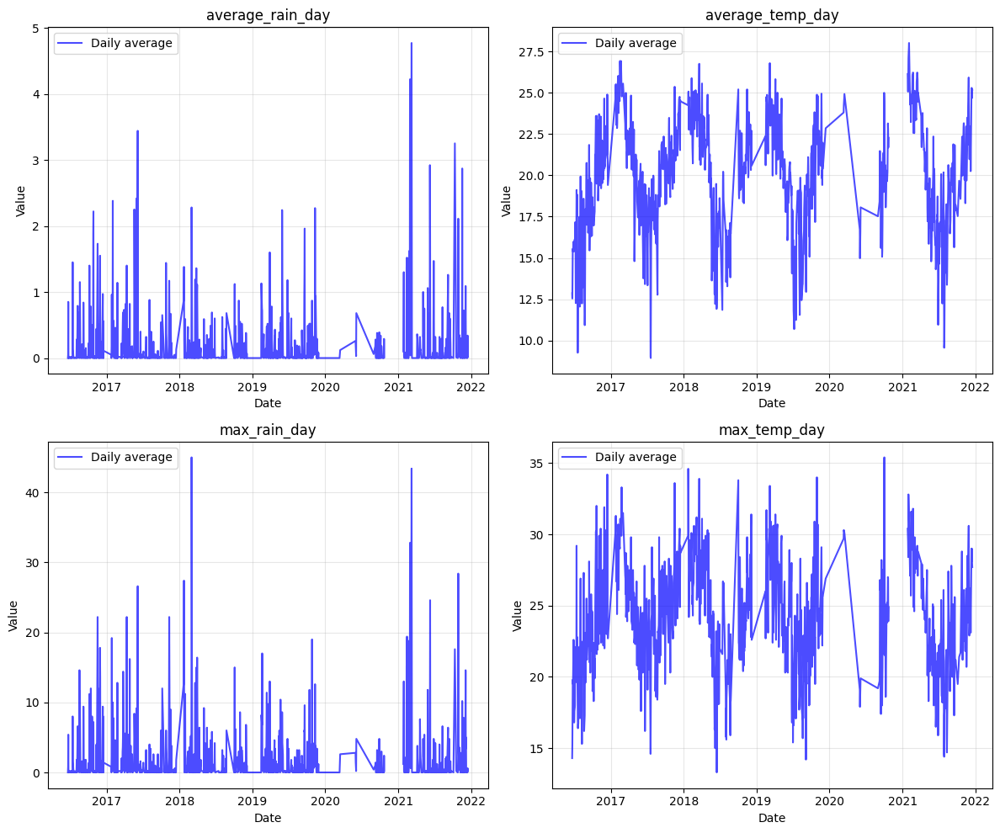

Summary statistics after filling:
       average_rain_day  average_temp_day  max_rain_day  max_temp_day
count      48577.000000      48577.000000  48577.000000  48577.000000
mean           0.190119         19.748317      1.895687     23.961984
std            0.452214          3.428767      4.445412      3.819804
min            0.000000          8.940000      0.000000     13.300000
25%            0.000000         17.480000      0.000000     21.400000
50%            0.010000         20.060000      0.200000     23.900000
75%            0.150000         22.120000      1.600000     26.500000
max            4.770000         28.010000     45.000000     35.400000


In [ ]:
import matplotlib.pyplot as plt

def visualize_gaps(df, date_col, weather_cols):
    fig, axes = plt.subplots(2, 2, figsize=(12, 10))
    axes = axes.ravel()

    for idx, col in enumerate(weather_cols):
        ax = axes[idx]
        daily_avg = df.groupby(date_col)[col].mean().reset_index()

        ax.plot(daily_avg[date_col], daily_avg[col], 'b-', alpha=0.7, label='Daily average')
        ax.set_title(f'{col}')
        ax.set_xlabel('Date')
        ax.set_ylabel('Value')
        ax.legend()
        ax.grid(True, alpha=0.3)

    plt.tight_layout()
    plt.show()

    print("Summary statistics after filling:")
    print(df[weather_cols].describe())

visualize_gaps(cleared_from_null_df, date_col=date_col, weather_cols=weather_cols)

Видимо, кто-то уже заполнял пропуски в этих признаках до нас

Мы будем использовать иерархический метод для поиска ближайших доступных значений в пределах временного окна.

Сначала проверим данные за ближайшие дни, начиная с одного дня и постепенно увеличивая радиус до заданного окна (7 дней в обе стороны от текущей даты) до первого найденного значения.

Если в пределах заданного окна нет вещественных значений, обращаемся к сезонным паттернам, вычисляя среднее значение для соответствующего месяца.

In [ ]:
from datetime import timedelta

def fill_weather_with_neighbors(df, date_col, weather_cols, window=7):
    df = df.sort_values(date_col).reset_index(drop=True)

    for col in weather_cols:
        nan_indices = df.index[df[col].isnull()].tolist()

        for idx in nan_indices:
            current_date = df.at[idx, date_col]
            best_value = None
            best_distance = float('inf')

            for offset in range(1, window + 1):
                found_value = False

                for direction in [-1, 1]:
                    check_date = current_date + timedelta(days=offset * direction)
                    same_date_rows = df[df[date_col] == check_date]
                    if not same_date_rows.empty:
                        values = same_date_rows[col].dropna()
                        if not values.empty:
                            candidate_value = values.mean()
                            if best_distance > offset:
                                best_value = candidate_value
                                best_distance = offset
                                found_value = True
                if found_value:
                    break

            if best_value is not None:
                df.at[idx, col] = best_value
            else:
                month = current_date.month
                month_values = df[(df[date_col].dt.month == month) & (df[col].notnull())][col]
                df.at[idx, col] = month_values.mean()

    return df

cleared_from_null_df = fill_weather_with_neighbors(
    cleared_from_null_df,
    date_col=date_col,
    weather_cols=weather_cols,
    window=7
)

In [ ]:
missing_weather_after = cleared_from_null_df[weather_cols].isnull().sum()
print(f"Missing values after filling:\n{missing_weather_after}")

Missing values after filling:
average_rain_day    0
average_temp_day    0
max_rain_day        0
max_temp_day        0
dtype: int64


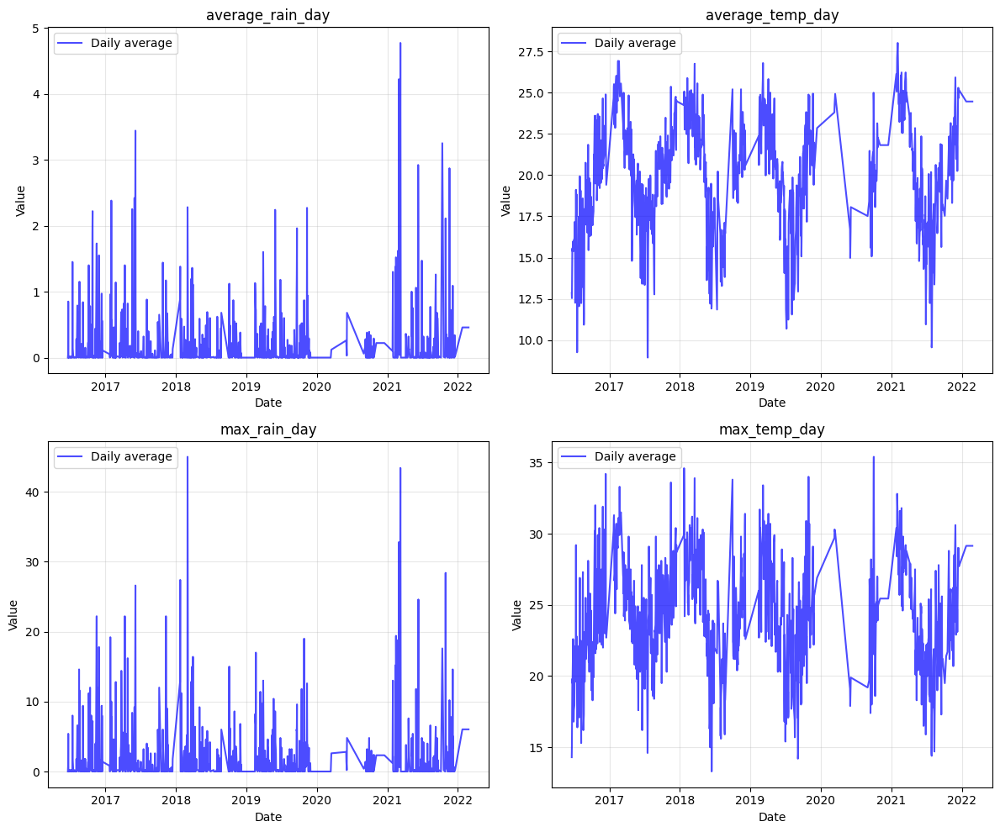

Summary statistics after filling:
       average_rain_day  average_temp_day  max_rain_day  max_temp_day
count      49593.000000      49593.000000  49593.000000  49593.000000
mean           0.195239         19.840879      1.974793     24.062691
std            0.449042          3.454692      4.435654      3.846538
min            0.000000          8.940000      0.000000     13.300000
25%            0.000000         17.530000      0.000000     21.500000
50%            0.010000         20.150000      0.200000     23.900000
75%            0.180000         22.400000      1.800000     26.700000
max            4.770000         28.010000     45.000000     35.400000


In [ ]:
visualize_gaps(cleared_from_null_df, date_col=date_col, weather_cols=weather_cols)

Пойдем дальше по признакам, требующим заполнения пропущенных значений

In [ ]:
analyze_missing_values_by_column(cleared_from_null_df)

        column  missing_count  missing_percent
0          age          10350        20.869881
9    specialty           7454        15.030347
10  disability           5146        10.376464


В стратегии заполнения возраста `age` используется иерархический подход:
 1) вычисляются медианные значения возраста для каждой медицинской специальности `specialty`, и для пациентов с пропущенным возрастом, у которых указана специальность, пропуски заполняются соответствующей медианой;
 2) для случаев, когда специальность неизвестна или не имеет достаточных данных, применяется алгоритм k-ближайших соседей (KNN), который на основе известных значений возраста у пациентов с аналогичными характеристиками (специальность, тип инвалидности `disability` и возрастная категория до 12 лет `under_12_years_old`) предсказывает пропущенные значения, причем используется взвешенный KNN-регрессор, где более близкие соседи имеют больший вес.

In [ ]:
def fill_age_with_specialty_median(df):
    df_filled = df.copy()
    specialty_medians = df_filled.groupby('specialty')['age'].median()
    nan_indices = df_filled.index[df_filled['age'].isnull()].tolist()
    filled_count = 0

    for idx in nan_indices:
        specialty = df_filled.at[idx, 'specialty']
        if specialty in specialty_medians and not pd.isna(specialty_medians[specialty]):
            df_filled.at[idx, 'age'] = specialty_medians[specialty]
            filled_count += 1

    print(f"Age filled by specialty median: {filled_count}")
    return df_filled

def fill_age_with_knn(df, k=5):
    df_filled = df.copy()
    features = ['specialty', 'disability', 'under_12_years_old']
    features = [f for f in features if f in df_filled.columns]
    known_data = df_filled[df_filled['age'].notnull()]
    unknown_data = df_filled[df_filled['age'].isnull()]
    if len(known_data) == 0 or len(unknown_data) == 0:
        return df_filled

    X_train = pd.get_dummies(known_data[features], drop_first=True)
    X_predict = pd.get_dummies(unknown_data[features], drop_first=True)
    X_train, X_predict = X_train.align(X_predict, join='left', axis=1, fill_value=0)
    X_predict = X_predict[X_train.columns]
    y_train = known_data['age']

    from sklearn.neighbors import KNeighborsRegressor
    knn = KNeighborsRegressor(n_neighbors=min(k, len(known_data)), weights='distance')
    knn.fit(X_train, y_train)
    predictions = knn.predict(X_predict)
    df_filled.loc[unknown_data.index, 'age'] = predictions

    print(f"Age KNN filled: {len(unknown_data)}")
    return df_filled

In [ ]:
# @title visualize_age_filling
import plotly.graph_objects as go
from plotly.subplots import make_subplots

def visualize_age_filling(df_before, df_after):
    fig = make_subplots(
        rows=2, cols=2,
        subplot_titles=('Age Distribution (Before)', 'Age Distribution (After)',
                        'Age Box Plot (Before)', 'Age Box Plot (After)')
    )

    age_before = df_before['age'].dropna()
    age_after = df_after['age']

    fig.add_trace(go.Histogram(x=age_before, nbinsx=30, name='Before'), row=1, col=1)
    fig.add_trace(go.Histogram(x=age_after, nbinsx=30, name='After'), row=1, col=2)

    fig.add_trace(go.Box(y=age_before, name='Before', showlegend=False), row=2, col=1)
    fig.add_trace(go.Box(y=age_after, name='After', showlegend=False), row=2, col=2)

    fig.update_xaxes(title_text='Age', row=1, col=1)
    fig.update_xaxes(title_text='Age', row=1, col=2)
    fig.update_yaxes(title_text='Frequency', row=1, col=1)
    fig.update_yaxes(title_text='Frequency', row=1, col=2)
    fig.update_yaxes(title_text='Age', row=2, col=1)
    fig.update_yaxes(title_text='Age', row=2, col=2)

    fig.update_layout(height=1500, showlegend=True)
    fig.show()

    print(f"Missing before: {df_before['age'].isnull().sum()}")
    print(f"Missing after: {df_after['age'].isnull().sum()}")

    stats = df_after['age'].agg(['mean', 'median', 'std', 'min', 'max'])
    print("\nAge statistics after filling:")
    print(f"  Mean: {stats['mean']:.2f}")
    print(f"  Median: {stats['median']:.2f}")
    print(f"  Std: {stats['std']:.2f}")
    print(f"  Min: {stats['min']:.2f}")
    print(f"  Max: {stats['max']:.2f}")

In [ ]:
if cleared_from_null_df['age'].isnull().any():
    df_before = cleared_from_null_df.copy()
    df_step1 = fill_age_with_specialty_median(cleared_from_null_df)
    df_final = fill_age_with_knn(df_step1)
    visualize_age_filling(df_before, df_final)
    cleared_from_null_df = df_final

Age filled by specialty median: 7416
Age KNN filled: 2934


Missing before: 10350
Missing after: 0

Age statistics after filling:
  Mean: 17.76
  Median: 11.00
  Std: 17.59
  Min: 2.00
  Max: 110.00


В стратегии заполнения специальности `specialty` используется алгоритм k-ближайших соседей (KNN):
1) в качестве признаков для определения похожести пациентов используются возраст `age`, тип инвалидности `disability` и возрастная категория до 12 лет `under_12_years_old`;
2) пропущенные значения в признаках заполняются медианными значениями из обучающей выборки.

In [ ]:
from sklearn.neighbors import KNeighborsClassifier

def fill_specialty_with_knn(df, k=7):
    nan_mask = df['specialty'].isnull()
    if not nan_mask.any():
        return df

    known_data = df[~nan_mask]
    unknown_mask = nan_mask.copy()

    features = ['age', 'disability', 'under_12_years_old']

    X_train = known_data[features].copy()
    X_predict = df.loc[unknown_mask, features].copy()

    for col in features:
        if X_train[col].dtype == 'object':
            all_vals = pd.concat([X_train[col], X_predict[col]]).dropna().unique()
            val_map = {v: i for i, v in enumerate(all_vals)}
            X_train[col] = X_train[col].map(val_map)
            X_predict[col] = X_predict[col].map(val_map)

        median_val = X_train[col].median()
        X_train[col] = X_train[col].fillna(median_val)
        X_predict[col] = X_predict[col].fillna(median_val)

    knn = KNeighborsClassifier(n_neighbors=k, weights='distance')
    knn.fit(X_train, known_data['specialty'])

    df.loc[unknown_mask, 'specialty'] = knn.predict(X_predict)
    return df

In [ ]:
# @title visualize_specialty_filling
import plotly.graph_objects as go

def visualize_specialty_filling(df_before, df_after):
    top_5_before = df_before['specialty'].value_counts().head(5)
    top_5_after = df_after['specialty'].value_counts().head(5)
    fig = go.Figure()

    fig.add_trace(go.Bar(x=top_5_before.index, y=top_5_before.values,
                         name='Before', marker_color='lightblue'))
    fig.add_trace(go.Bar(x=top_5_after.index, y=top_5_after.values,
                         name='After', marker_color='lightcoral'))
    fig.update_layout(
        title='Top 5 Specialties (Before vs After)',
        xaxis_title='Specialty',
        yaxis_title='Count',
        barmode='group',
        showlegend=True
    )

    fig.update_xaxes(tickangle=45)
    fig.show()

    print(f"Missing before: {df_before['specialty'].isnull().sum()}")
    print(f"Missing after: {df_after['specialty'].isnull().sum()}")

In [ ]:
if cleared_from_null_df['specialty'].isnull().any():
    original_disability = cleared_from_null_df['disability'].copy()
    df_before = cleared_from_null_df.copy()
    cleared_from_null_df = fill_specialty_with_knn(cleared_from_null_df)
    cleared_from_null_df['disability'] = original_disability.combine_first(cleared_from_null_df['disability'])
    visualize_specialty_filling(df_before, cleared_from_null_df)

Missing before: 7454
Missing after: 0


Сначала для каждой `specialty`, содержащей более 50 записей с известной `disability`, определяется доминирующая категория (`intellectual` или `motor`), но только если она составляет более 70% случаев в данной специальности.

Данные группируются по возрастным категориям (дети до 12 лет, подростки 12-18, молодые 18-30, средний возраст 30-50 и старше 50), и для каждой возрастной группы с более чем 100 записями также выявляется доминирующий тип инвалидности `disability`, если он превышает 65% случаев в группе.

В результате получаем два словаря: соответствия между специальностями и преобладающим типом `disability`, а также между возрастными группами и характерной для них `disability`, которые затем используются для более осознанного заполнения пропусков

In [ ]:
def analyze_disability_patterns(df):
    specialty_disability = {}
    for specialty in df['specialty'].dropna().unique():
        mask = (df['specialty'] == specialty) & (df['disability'].notnull())
        if mask.sum() > 50:
            disability_counts = df.loc[mask, 'disability'].value_counts(normalize=True)
            if disability_counts.max() > 0.7:
                specialty_disability[specialty] = disability_counts.idxmax()

    age_group_disability = {}
    df['age_group'] = pd.cut(df['age'], bins=[0, 12, 18, 30, 50, 100], labels=['child', 'teen', 'young', 'middle', 'senior'])
    for age_group in df['age_group'].dropna().unique():
        mask = (df['age_group'] == age_group) & (df['disability'].notnull())
        if mask.sum() > 100:
            disability_counts = df.loc[mask, 'disability'].value_counts(normalize=True)
            if disability_counts.max() > 0.65:
                age_group_disability[age_group] = disability_counts.idxmax()

    return specialty_disability, age_group_disability

def fill_disability_with_rules(df, specialty_rules, age_rules):
    df_filled = df.copy()
    rules_filled = 0
    nan_indices = df_filled.index[df_filled['disability'].isnull()].tolist()

    for idx in nan_indices:
        row = df_filled.loc[idx]
        if row['specialty'] in specialty_rules:
            df_filled.at[idx, 'disability'] = specialty_rules[row['specialty']]
            rules_filled += 1
            continue
        if 'age_group' in df_filled.columns and row['age_group'] in age_rules:
            df_filled.at[idx, 'disability'] = age_rules[row['age_group']]
            rules_filled += 1

    print(f"Disability rules filled: {rules_filled}")
    if 'age_group' in df_filled.columns:
        df_filled = df_filled.drop('age_group', axis=1)

    return df_filled

In [ ]:
# @title visualize_disability_filling
import plotly.graph_objects as go
from plotly.subplots import make_subplots

def visualize_disability_filling(df_before, df_after):
    fig = make_subplots(
        rows=1, cols=2,
        subplot_titles=('Disability Before Filling', 'Disability After Filling'),
        specs=[[{'type': 'domain'}, {'type': 'domain'}]]
    )

    before_counts = df_before['disability'].value_counts()
    after_counts = df_after['disability'].value_counts()

    fig.add_trace(go.Pie(labels=before_counts.index, values=before_counts.values, name='Before'),
                  row=1, col=1)
    fig.add_trace(go.Pie(labels=after_counts.index, values=after_counts.values, name='After'),
                  row=1, col=2)

    fig.update_layout(height=700, showlegend=True)
    fig.show()

    print(f"Missing before: {df_before['disability'].isnull().sum()}")
    print(f"Missing after: {df_after['disability'].isnull().sum()}")

In [ ]:
if cleared_from_null_df['disability'].isnull().any():
    df_before = cleared_from_null_df.copy()
    specialty_rules, age_rules = analyze_disability_patterns(cleared_from_null_df)
    df_final = fill_disability_with_rules(cleared_from_null_df, specialty_rules, age_rules)
    visualize_disability_filling(df_before, df_final)
    cleared_from_null_df = df_final

Disability rules filled: 5146


Missing before: 5146
Missing after: 0


Кажется, с пропусками - ВСË!

In [ ]:
analyze_missing_values_by_column(cleared_from_null_df)

'No more missing values!'

### Outliers

Цель: выявить и охарактеризовать выбросы в числовых переменных, используя методы межквартильного размаха (IQR) и Z-score. Выбрать и обосновать подходящую стратегию обработки выбросов (удаление, замену на граничные значения или преобразование данных) и реализовать её для сохранения информативности признаков при минимизации искажающего влияния экстремальных значений.

In [ ]:
from scipy import stats
from prettytable import PrettyTable

def detect_and_handle_outliers(df, iqr_cols, zscore_cols, iqr_multiplier=1.5, z_threshold=3):
    df_processed = df.copy()
    all_cols = iqr_cols + zscore_cols
    table = PrettyTable()
    table.field_names = ["Variable", "Method", "Outliers", "Percentage"]

    for col in all_cols:
        data = df[col].dropna()

        if col in iqr_cols:
            Q1 = data.quantile(0.25)
            Q3 = data.quantile(0.75)
            IQR = Q3 - Q1
            lower_bound = Q1 - iqr_multiplier * IQR
            upper_bound = Q3 + iqr_multiplier * IQR
            outliers_mask = (df[col] < lower_bound) | (df[col] > upper_bound)
            method = "IQR"
            df_processed.loc[outliers_mask & (df[col] < lower_bound), col] = lower_bound
            df_processed.loc[outliers_mask & (df[col] > upper_bound), col] = upper_bound
        else:
            z_scores = np.abs(stats.zscore(data))
            outliers_mask = pd.Series(False, index=df.index)
            outliers_mask.loc[data.index] = z_scores > z_threshold
            method = "Z-score"

        outliers_count = outliers_mask.sum()
        outliers_percent = (outliers_count / len(df)) * 100
        table.add_row([col, method, outliers_count, f"{outliers_percent:.2f}%"])

        if col in zscore_cols and outliers_mask.any():
            df_processed = df_processed[~outliers_mask]

    print(table)
    return df_processed.reset_index(drop=True)

def visualize_outliers_comparison(df_before, df_after, iqr_cols, zscore_cols):
    all_cols = iqr_cols + zscore_cols
    for col in all_cols:
        fig = make_subplots(rows=1, cols=3, subplot_titles=[f'{col} - before', f'{col} - distribution', f'{col} - after'])
        fig.add_trace(go.Box(y=df_before[col].dropna(), name='before'), row=1, col=1)
        fig.add_trace(go.Histogram(x=df_before[col].dropna(), nbinsx=50), row=1, col=2)
        fig.add_trace(go.Box(y=df_after[col].dropna(), name='after'), row=1, col=3)
        fig.update_layout(showlegend=False)
        fig.show()

In [ ]:
outliers_free_df = cleared_from_null_df.copy()
print("Numeric features in use:", numeric_cols)

Numeric features in use: ['age', 'average_temp_day', 'average_rain_day', 'max_temp_day', 'max_rain_day']


Метод межквартильного размаха (IQR) для признаков `age`, `average_rain_day` и `max_rain_day работает` путем вычисления границ, основанных на статистиках распределения:
1) был выбран, так как IQR устойчив к ненормальному распределению данных и особенно подходит для переменных, демонстрирующих асимметрию;
2) после идентификации выбросов стратегия обработки включает замену значений за нижней границей IQR на саму границу, значений за верхней границей IQR на верхнюю границу.

Метод Z-score для переменных `average_temp_day` и `max_temp_day` использует стандартное отклонение от среднего значения, где любые наблюдения, превышающие три стандартных отклонения, считаются выбросами;
1) был выбран, так как оптимален для данных, приближенных к нормальному распределению (у нас это как раз температурные показатели).
2)  после идентификации выбросов стратегия обработки удаляет их (ввиду незначительности доли выбросов).

In [ ]:
from scipy import stats
from prettytable import PrettyTable

def detect_outliers(df, col, iqr_multiplier=1.5, z_threshold=3):
    data = df[col].dropna()

    Q1 = data.quantile(0.25)
    Q3 = data.quantile(0.75)
    IQR = Q3 - Q1
    lower_iqr = Q1 - iqr_multiplier * IQR
    upper_iqr = Q3 + iqr_multiplier * IQR
    outliers_iqr = (df[col] < lower_iqr) | (df[col] > upper_iqr)

    z_scores = np.abs(stats.zscore(data))
    outliers_z = pd.Series(False, index=df.index)
    outliers_z.loc[data.index] = z_scores > z_threshold

    intersection = (outliers_iqr & outliers_z).sum()
    union = (outliers_iqr | outliers_z).sum()
    jaccard = intersection / union if union > 0 else 0

    return {
        'outliers_iqr': outliers_iqr,
        'outliers_z': outliers_z,
        'lower_iqr': lower_iqr,
        'upper_iqr': upper_iqr,
        'jaccard': jaccard,
        'intersection': intersection
    }

def apply_strategy(df, col, col_type, detection_results):
    outliers_iqr = detection_results['outliers_iqr']
    outliers_z = detection_results['outliers_z']
    lower_iqr = detection_results['lower_iqr']
    upper_iqr = detection_results['upper_iqr']
    jaccard = detection_results['jaccard']

    if col_type == 'iqr':
        if jaccard > 0.3:
            outliers_mask = outliers_iqr
            strategy = "IQR-capped"
        else:
            outliers_mask = outliers_iqr & outliers_z
            strategy = "Intersection-capped"

        df.loc[outliers_mask & (df[col] < lower_iqr), col] = lower_iqr
        df.loc[outliers_mask & (df[col] > upper_iqr), col] = upper_iqr

    else:
        if jaccard > 0.4:
            outliers_mask = outliers_z
            strategy = "Z-score-removed"
        else:
            outliers_mask = outliers_iqr & outliers_z
            strategy = "Intersection-removed"

    return df, outliers_mask, strategy

In [ ]:
# @title visualize_outliers_analysis
def visualize_outliers_analysis(df, iqr_cols, zscore_cols):
    for col in iqr_cols + zscore_cols:
        detection_results = detect_outliers(df, col)
        outliers_iqr = detection_results['outliers_iqr']
        outliers_z = detection_results['outliers_z']

        data = df[col].dropna()

        fig = make_subplots(
            rows=2, cols=2,
            subplot_titles=[
                f'{col} - Data with IQR Boundaries',
                f'{col} - Z-score Distribution',
                f'{col} - Method Comparison',
                f'{col} - Combined Outliers'
            ]
        )

        fig.add_trace(go.Scatter(x=data.index, y=data, mode='markers', name='Data'), row=1, col=1)
        fig.add_hline(y=detection_results['lower_iqr'], line_dash="dash", line_color="red", row=1, col=1, name='Lower IQR')
        fig.add_hline(y=detection_results['upper_iqr'], line_dash="dash", line_color="red", row=1, col=1, name='Upper IQR')
        fig.update_xaxes(title_text="Index", row=1, col=1)
        fig.update_yaxes(title_text=f"{col} Value", row=1, col=1)

        z_scores = np.abs(stats.zscore(data))
        fig.add_trace(go.Histogram(x=z_scores, nbinsx=30, name='Z-scores'), row=1, col=2)
        fig.add_vline(x=3, line_dash="dash", line_color="red", row=1, col=2, name='Z=3 threshold')
        fig.update_xaxes(title_text="Z-score", row=1, col=2)
        fig.update_yaxes(title_text="Frequency", row=1, col=2)

        labels = ['IQR only', 'Z-score only', 'Both', 'Neither']
        values = [
            (outliers_iqr.loc[data.index] & ~outliers_z.loc[data.index]).sum(),
            (~outliers_iqr.loc[data.index] & outliers_z.loc[data.index]).sum(),
            (outliers_iqr.loc[data.index] & outliers_z.loc[data.index]).sum(),
            (~outliers_iqr.loc[data.index] & ~outliers_z.loc[data.index]).sum()
        ]

        fig.add_trace(go.Bar(x=labels, y=values, name='Count'), row=2, col=1)
        fig.update_xaxes(title_text="Outlier Detection Method", row=2, col=1)
        fig.update_yaxes(title_text="Number of Points", row=2, col=1)

        colors = []
        for i in range(len(data)):
            idx = data.index[i]
            if not (outliers_iqr[idx] or outliers_z[idx]):
                colors.append('green')
            elif outliers_iqr[idx] != outliers_z[idx]:
                colors.append('orange')
            else:
                colors.append('red')

        fig.add_trace(go.Scatter(x=data.index, y=data, mode='markers', marker=dict(color=colors), name='Outlier Status'), row=2, col=2)
        fig.update_xaxes(title_text="Index", row=2, col=2)
        fig.update_yaxes(title_text=f"{col} Value", row=2, col=2)

        fig.update_layout(
            height=800,
            title_text=f"Outlier Analysis: {col}",
            showlegend=True
        )
        fig.show()

In [ ]:
iqr_cols = ["age", "average_rain_day", "max_rain_day"]
zscore_cols = ["average_temp_day", "max_temp_day"]

outliers_free_df_before = outliers_free_df.copy()
visualize_outliers_analysis(outliers_free_df, iqr_cols, zscore_cols)

In [ ]:
def analyze_and_handle_outliers(df, iqr_cols, zscore_cols, iqr_multiplier=1.5, z_threshold=3):
    df_processed = df.copy()
    table = PrettyTable()
    table.field_names = ["Variable", "IQR", "Z-score", "Intersection", "Jaccard", "Strategy"]

    total_outliers_mask = pd.Series(False, index=df.index)
    results = {}

    for col in iqr_cols + zscore_cols:
        detection_results = detect_outliers(df, col, iqr_multiplier, z_threshold)
        results[col] = detection_results

        col_type = 'iqr' if col in iqr_cols else 'zscore'
        df_processed, outliers_mask, strategy = apply_strategy(df_processed, col, col_type, detection_results)

        if col_type == 'zscore':
            total_outliers_mask = total_outliers_mask | outliers_mask

        table.add_row([
            col,
            detection_results['outliers_iqr'].sum(),
            detection_results['outliers_z'].sum(),
            detection_results['intersection'],
            f"{detection_results['jaccard']:.3f}",
            strategy
        ])

    if total_outliers_mask.any():
        df_processed = df_processed[~total_outliers_mask].reset_index(drop=True)

    print("Outlier Analysis and Handling:")
    print(table)
    print(f"\nRows removed: {total_outliers_mask.sum()}")
    print(f"Final size: {len(df_processed)} rows")

    return df_processed, results

In [ ]:
outliers_free_df, analysis_results = analyze_and_handle_outliers(
    outliers_free_df,
    iqr_cols=iqr_cols,
    zscore_cols=zscore_cols
)

Outlier Analysis and Handling:
+------------------+------+---------+--------------+---------+----------------------+
|     Variable     | IQR  | Z-score | Intersection | Jaccard |       Strategy       |
+------------------+------+---------+--------------+---------+----------------------+
|       age        | 7095 |   1094  |     1094     |  0.154  | Intersection-capped  |
| average_rain_day | 7212 |   1300  |     1300     |  0.180  | Intersection-capped  |
|   max_rain_day   | 6546 |   1196  |     1196     |  0.183  | Intersection-capped  |
| average_temp_day | 318  |   231   |     231      |  0.726  |   Z-score-removed    |
|   max_temp_day   | 153  |    0    |      0       |  0.000  | Intersection-removed |
+------------------+------+---------+--------------+---------+----------------------+

Rows removed: 231
Final size: 49362 rows


In [ ]:
df = outliers_free_df

### Transformation

1. age

**Преобразование не требуется**  
Почему?   
Хотя распределение возраста асимметрично, возраст — это переменная с естественной интерпретацией, и, как я полагаю, его шкала имеет определённый внутренний смысл. Применение логарифмического или степенного преобразования безосновательно разрушит этот смысл.

2. average_temp_day

**Преобразование не требуется**  
Почему?  
Распределение выглядит как близкое к нормальному, нет тяжёлого скоса или хвоста, которые бы оправдывали применение преобразования

3. max_temp_day

**Преобразование не требуется**  
Почему?  
Распределение близко к нормальному, и значения имеют физический смысл в своём исходном виде. Полагаю, преобразования не улучшат производительность модели.



4. average_rain_day

**Требуется преобразование**   
Почему?   
Этот признак демонстрирует сильную правостороннюю асимметрию, большое скопление нулей и длинный положительный хвост. Такие распределения нарушают предположения линейных моделей  

Кажется, логарифмическое преобразование является стандартной практикой в метеорологии для анализа, можно попробовать. Преобразованное значение интерпретируется не как "миллиметры дождя", а скорее как нормализованное представление интенсивности

5. max_rain_day

**Требуется преобразование!**  
Почему?  
Этот признак имеет те же характеристики распределения, что и average_rain_day — большой всплеск на нуле и длинный хвост. Применяются те же правила

Бинарные переменные не требуют никакого преобразования. Это включает такие признаки, как индикаторы шторма и другие погодные признаки. Их дисбаланс в значениях не является статистической проблемой

Давайте реализуем кастомное преобразование на основе log1p, которое обрабатывает нули, очень малые значения и отрицательные значения

In [ ]:
def safe_log_transform(x):
    x = x.copy()
    min_positive = x[x > 0].min()

    if pd.isna(min_positive):
        return x * 0

    # shift negatives
    shift = 0
    if (x < 0).any():
        shift = abs(x.min()) + 1e-6

    return np.log1p(x + shift)


Имплементация с нуля Yeo-Johnson преобразования, на вход передаём lambda

In [ ]:
def yeo_johnson_transform(x, lamb):
    x = x.copy()
    y = np.zeros_like(x, dtype=float)

    pos = x >= 0
    neg = ~pos

    # Positive part
    if lamb != 0:
        y[pos] = ((x[pos] + 1)**lamb - 1) / lamb
    else:
        y[pos] = np.log1p(x[pos])

    # Negative part
    if lamb != 2:
        y[neg] = -(((-x[neg] + 1)**(2 - lamb) - 1) / (2 - lamb))
    else:
        y[neg] = -np.log1p(-x[neg])

    return pd.Series(y, index=x.index)

Найдем лучшее значение лямбда, чтобы справиться с асимметрией



In [ ]:
def optimal_yeo_johnson_lambda(x, lambdas=None):
    if lambdas is None:
        lambdas = np.linspace(-50, 50, 501)

    best_lambda = None
    best_skew = np.inf
    best_transformed = None

    for l in lambdas:
        t = yeo_johnson_transform(x, l)
        s = t.skew()
        if abs(s) < best_skew:
            best_skew = abs(s)
            best_lambda = l
            best_transformed = t

    return best_lambda, best_transformed

In [ ]:
def compare_transformations(df, col):
    original = df[col]

    # Safe log
    t_log = safe_log_transform(original)

    # Yeo-Johnson с подбором λ вручную
    opt_lambda, t_yj_opt = optimal_yeo_johnson_lambda(original.fillna(0))

    print(f"Feature: {col}")
    print(f"Original skewness: {original.skew():.3f}")
    print(f"SafeLog skewness: {t_log.skew():.3f}")
    print(f"Yeo-Johnson optimal λ={opt_lambda:.3f} skewness: {t_yj_opt.skew():.3f}")

    return pd.DataFrame({
        "original": original,
        "log": t_log,
        "yj_opt": t_yj_opt
    }), opt_lambda

In [ ]:
rain_cols = ["average_rain_day", "max_rain_day"]
df_transform = df.copy()
for c in rain_cols:
    df_transform[c] = pd.to_numeric(df_transform[c], errors="coerce")

rain_transformed = {}
optimal_lambdas = {}

for col in rain_cols:
    transformed_df, opt_lambda = compare_transformations(df_transform, col)
    rain_transformed[col] = transformed_df
    optimal_lambdas[col] = opt_lambda

print("Optimal lambdas for Yeo-Johnson:")
print(optimal_lambdas)

Feature: average_rain_day
Original skewness: 2.412
SafeLog skewness: 1.894
Yeo-Johnson optimal λ=-50.000 skewness: 0.026
Feature: max_rain_day
Original skewness: 2.439
SafeLog skewness: 1.199
Yeo-Johnson optimal λ=-3.600 skewness: -0.012
Optimal lambdas for Yeo-Johnson:
{'average_rain_day': np.float64(-50.0), 'max_rain_day': np.float64(-3.5999999999999943)}


Судя по тому, что у average_rain_day так сильно уводится первый признак в -50, признак мультимодальный и мы пытаемся два (или больше) пика свести к одному, что принципиально неправильно. Проверим это

In [ ]:
def is_bimodal_kde(x, bandwidth='scott', peak_prominence=0.01):
    x = x[~np.isnan(x)].reshape(-1, 1)

    if bandwidth == "scott":
        bandwidth = np.std(x) * (len(x) ** (-1/5))
    kde = KernelDensity(kernel='gaussian', bandwidth=bandwidth).fit(x)

    grid = np.linspace(np.min(x), np.max(x), 2000).reshape(-1, 1)
    log_dens = kde.score_samples(grid)
    dens = np.exp(log_dens)

    peaks, _ = find_peaks(dens, prominence=peak_prominence)

    return len(peaks) >= 2, peaks, grid, dens

In [ ]:
is_bi, peaks, grid, dens = is_bimodal_kde(df["average_rain_day"].values)
print("Bimodal:", is_bi)

Bimodal: True


In [ ]:
is_bi, peaks, grid, dens = is_bimodal_kde(df["max_rain_day"].values)
print("Bimodal:", is_bi)

Bimodal: True


Значит, подход неверный и нам надо не стремиться к нормальности, а просто сделать эти значения более удобными для модели. Кажется, лучшей тактикой будет применить log transform и сделать feature engineering к данным. Видимо, дело в том, что в нашем случае осадки часто  делятся на категории: нет дождя, слабый, умеренный, сильный. У нас уже есть такой категориальный признак, поэтому мы не делаем его, а вот для логистической регрессии будет полезно сделать численное выражение rain_intensity_value - разница между максимальным и средним значением

In [ ]:
def process_rain_features(df, rain_cols):
    df[rain_cols] = df[rain_cols].apply(
        lambda col: pd.to_numeric(col, errors="coerce")
    )

    for col in rain_cols:
        p95 = df[col].quantile(0.95)
        df[col] = np.where(df[col] > p95, p95, df[col])

    df["average_rain_day"] = safe_log_transform(df["average_rain_day"])
    df["max_rain_day"] = safe_log_transform(df["max_rain_day"])

    # Интенсивность дождя
    df["rain_intensity_value"] = df["max_rain_day"] - df["average_rain_day"]

In [ ]:
process_rain_features(df, rain_cols)

###Scaling

Мы используем скалирование, так как планируем делать logreg. Преимущества в том, что делаем данные с нулевым средним и дисперсией 1, что идеально подходит для линейных моделей. К выбросам такой подход более устойчив, чем min-max. Мы ещё попробуем деревья, но там вообще ничего не нужно

In [ ]:
numeric_cols = ["age", "average_temp_day", "max_temp_day", "max_rain_day", "average_rain_day"]

means = df[numeric_cols].mean()
stds = df[numeric_cols].std(ddof=0)

df_scaled = df.copy()

# применяем формулу (x - mean) / std
df_scaled[numeric_cols] = (df_scaled[numeric_cols] - means) / stds


In [ ]:
df_scaled[numeric_cols]

,age,average_temp_day,max_temp_day,max_rain_day,average_rain_day
0,-0.643556,-2.075604,-2.567445,-0.785641,-0.643809
1,2.993413,-2.075604,-2.567445,-0.785641,-0.643809
2,-0.239448,-2.075604,-2.567445,-0.785641,-0.643809
3,-0.576204,-2.075604,-2.567445,-0.785641,-0.643809
4,0.669794,-2.075604,-2.567445,-0.785641,-0.643809
...,...,...,...,...,...
49357,-0.172097,1.350227,1.322540,1.940359,1.582953
49358,3.464872,1.350227,1.322540,1.940359,1.582953
49359,-0.441502,1.350227,1.322540,1.940359,1.582953
49360,-0.172097,1.350227,1.322540,1.940359,1.582953


### Data noise reduction

In [ ]:
# исправление ошибок в числовых признаках

import warnings
warnings.filterwarnings('ignore')

from scipy import stats

numeric_features = ["age", "average_temp_day", "average_rain_day",
                    "max_temp_day", "max_rain_day"]

for col in numeric_features:
    if col not in df.columns:
        continue

    print(f"\n{col}:")
    corrections = 0

    if col == "age":
        # возраст не может быть отрицательным
        negative = (df[col] < 0).sum()
        if negative > 0:
            print(f"  Отрицательные значения: {negative}")
            df.loc[df[col] < 0, col] = np.nan
            corrections += negative

        # возраст не может быть больше 100
        too_old = (df[col] > 100).sum()
        if too_old > 0:
            print(f"  Значения > 100: {too_old}")
            df.loc[df[col] > 100, col] = np.nan
            corrections += too_old

        # обрезка экстремальных выбросов
        q01, q99 = df[col].quantile([0.01, 0.99])
        extreme = ((df[col] < q01) | (df[col] > q99)).sum()
        if extreme > 0:
            print(f"  Экстремальные значения: {extreme}")
            df[col] = df[col].clip(q01, q99)
            corrections += extreme


    if corrections > 0:
        print(f"  Всего исправлений: {corrections}")
    else:
        print(f"  Аномалий не обнаружено")



age:
  Экстремальные значения: 485
  Всего исправлений: 485

average_temp_day:
  Аномалий не обнаружено

average_rain_day:
  Аномалий не обнаружено

max_temp_day:
  Аномалий не обнаружено

max_rain_day:
  Аномалий не обнаружено


In [ ]:
df

,age,average_temp_day,average_rain_day,max_temp_day,max_rain_day,under_12_years_old,patient_needs_companion,rainy_day_before,storm_day_before,specialty,disability,appointment_month,rain_intensity,heat_intensity,appointment_shift,gender,appointment_date,no_show,rain_intensity_value
0,7.0,12.870000,0.000000,14.300000,0.000000,1,1,1,1,physiotherapy,motor,june,no_rain,heavy_cold,afternoon,M,2016-06-20,no,0.000000
1,61.0,12.870000,0.000000,14.300000,0.000000,0,1,1,1,physiotherapy,motor,june,no_rain,heavy_cold,afternoon,M,2016-06-20,no,0.000000
2,13.0,12.870000,0.000000,14.300000,0.000000,0,0,1,1,speech therapy,intellectual,june,no_rain,heavy_cold,afternoon,M,2016-06-20,no,0.000000
3,8.0,12.870000,0.000000,14.300000,0.000000,1,1,1,1,physiotherapy,intellectual,june,no_rain,heavy_cold,afternoon,F,2016-06-20,no,0.000000
4,26.5,12.870000,0.000000,14.300000,0.000000,0,1,1,1,speech therapy,motor,june,no_rain,heavy_cold,afternoon,F,2016-06-20,no,0.000000
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
49357,14.0,24.458911,0.376566,29.147387,1.949749,0,0,0,0,physiotherapy,intellectual,feb,no_rain,heavy_cold,afternoon,F,2022-02-25,no,1.573183
49358,68.0,24.458911,0.376566,29.147387,1.949749,0,1,0,0,speech therapy,motor,feb,no_rain,heavy_cold,afternoon,M,2022-02-25,no,1.573183
49359,10.0,24.458911,0.376566,29.147387,1.949749,0,0,0,0,speech therapy,intellectual,feb,no_rain,heavy_cold,afternoon,M,2022-02-25,no,1.573183
49360,14.0,24.458911,0.376566,29.147387,1.949749,0,0,0,0,physiotherapy,intellectual,feb,no_rain,heavy_cold,afternoon,M,2022-02-25,no,1.573183


In [ ]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 49362 entries, 0 to 49361
Data columns (total 19 columns):
 #   Column                   Non-Null Count  Dtype         
---  ------                   --------------  -----         
 0   age                      49362 non-null  float64       
 1   average_temp_day         49362 non-null  float64       
 2   average_rain_day         49362 non-null  float64       
 3   max_temp_day             49362 non-null  float64       
 4   max_rain_day             49362 non-null  float64       
 5   under_12_years_old       49362 non-null  int64         
 6   patient_needs_companion  49362 non-null  int64         
 7   rainy_day_before         49362 non-null  int64         
 8   storm_day_before         49362 non-null  int64         
 9   specialty                49362 non-null  object        
 10  disability               49362 non-null  object        
 11  appointment_month        49362 non-null  object        
 12  rain_intensity           49362 n

In [ ]:
df['specialty'] = (
    df['specialty']
    .astype(str)
    .str.lower()
    .str.strip()
)

In [ ]:
# проверка логической согласованности

if "age" in df.columns and "under_12_years_old" in df.columns:
    print("\nпроверка: age vs under_12_years_old")

    # несоответствие 1: under_12_years_old=1, но age >= 12
    inconsistent1 = ((df["under_12_years_old"] == 1) & (df["age"] >= 12)).sum()
    if inconsistent1 > 0:
        print(f"  Несоответствие: under_12_years_old=1, но age >= 12: {inconsistent1}")
        df.loc[(df["under_12_years_old"] == 1) & (df["age"] >= 12), "under_12_years_old"] = 0
        print(f"  Исправлено")

    # несоответствие 2: age < 12, но under_12_years_old=0
    inconsistent2 = ((df["age"] < 12) & (df["under_12_years_old"] == 0)).sum()
    if inconsistent2 > 0:
        print(f"  Несоответствие: age < 12, но under_12_years_old=0: {inconsistent2}")
        df.loc[(df["age"] < 12) & (df["under_12_years_old"] == 0), "under_12_years_old"] = 1
        print(f"  Исправлено")

    if inconsistent1 == 0 and inconsistent2 == 0:
        print(f"  Логическая согласованность соблюдена")


проверка: age vs under_12_years_old
  Несоответствие: under_12_years_old=1, но age >= 12: 2168
  Исправлено
  Несоответствие: age < 12, но under_12_years_old=0: 4870
  Исправлено


In [ ]:
# проверка для over_60_years_old
if "age" in df.columns and "over_60_years_old" in df.columns:
    print("\nпроверка: age vs over_60_years_old")

    # несоответствие 1: over_60_years_old=1, но age <= 60
    inconsistent1 = ((df["over_60_years_old"] == 1) & (df["age"] <= 60)).sum()
    if inconsistent1 > 0:
        print(f"  Несоответствие: over_60_years_old=1, но age <= 60: {inconsistent1}")
        df.loc[(df["over_60_years_old"] == 1) & (df["age"] <= 60), "over_60_years_old"] = 0
        print(f"  Исправлено")

    # несоответствие 2: age > 60, но over_60_years_old=0
    inconsistent2 = ((df["age"] > 60) & (df["over_60_years_old"] == 0)).sum()
    if inconsistent2 > 0:
        print(f"  Несоответствие: age > 60, но over_60_years_old=0: {inconsistent2}")
        df.loc[(df["age"] > 60) & (df["over_60_years_old"] == 0), "over_60_years_old"] = 1
        print(f"  Исправлено")

    if inconsistent1 == 0 and inconsistent2 == 0:
        print(f"  Логическая согласованность соблюдена")

In [ ]:
df

,age,average_temp_day,average_rain_day,max_temp_day,max_rain_day,under_12_years_old,patient_needs_companion,rainy_day_before,storm_day_before,specialty,disability,appointment_month,rain_intensity,heat_intensity,appointment_shift,gender,appointment_date,no_show,rain_intensity_value
0,7.0,12.870000,0.000000,14.300000,0.000000,1,1,1,1,physiotherapy,motor,june,no_rain,heavy_cold,afternoon,M,2016-06-20,no,0.000000
1,61.0,12.870000,0.000000,14.300000,0.000000,0,1,1,1,physiotherapy,motor,june,no_rain,heavy_cold,afternoon,M,2016-06-20,no,0.000000
2,13.0,12.870000,0.000000,14.300000,0.000000,0,0,1,1,speech therapy,intellectual,june,no_rain,heavy_cold,afternoon,M,2016-06-20,no,0.000000
3,8.0,12.870000,0.000000,14.300000,0.000000,1,1,1,1,physiotherapy,intellectual,june,no_rain,heavy_cold,afternoon,F,2016-06-20,no,0.000000
4,26.5,12.870000,0.000000,14.300000,0.000000,0,1,1,1,speech therapy,motor,june,no_rain,heavy_cold,afternoon,F,2016-06-20,no,0.000000
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
49357,14.0,24.458911,0.376566,29.147387,1.949749,0,0,0,0,physiotherapy,intellectual,feb,no_rain,heavy_cold,afternoon,F,2022-02-25,no,1.573183
49358,68.0,24.458911,0.376566,29.147387,1.949749,0,1,0,0,speech therapy,motor,feb,no_rain,heavy_cold,afternoon,M,2022-02-25,no,1.573183
49359,10.0,24.458911,0.376566,29.147387,1.949749,1,0,0,0,speech therapy,intellectual,feb,no_rain,heavy_cold,afternoon,M,2022-02-25,no,1.573183
49360,14.0,24.458911,0.376566,29.147387,1.949749,0,0,0,0,physiotherapy,intellectual,feb,no_rain,heavy_cold,afternoon,M,2022-02-25,no,1.573183


In [ ]:
initial_rows = len(df)
duplicates = df.duplicated().sum()

print(f"Исходное количество строк: {initial_rows}")
print(f"Полные дубликаты: {duplicates}")

if duplicates > 0:
    df = df.drop_duplicates()
    print(f"Удалено дубликатов: {duplicates}")
    print(f"Финальное количество строк: {len(df)}")
else:
    print("Дубликатов не обнаружено")

Исходное количество строк: 49362
Полные дубликаты: 15159
Удалено дубликатов: 15159
Финальное количество строк: 34203


### Preprocessing (Type enforcing and one-hot encoding)

In [ ]:
binary_cols = [
    "under_12_years_old", "rainy_day_before",
    "storm_day_before", "patient_needs_companion"
]

for c in binary_cols:
    df[c] = df[c].astype(bool)


In [ ]:
categorical_cols = [
    "specialty",
    "disability",
    "appointment_month",
    "rain_intensity",
    "heat_intensity",
    "appointment_shift",
    "gender"
]
for c in categorical_cols:
    df[c] = df[c].astype("string").astype("category")


In [ ]:
numeric_cols = ["age", "average_temp_day", "max_temp_day", "max_rain_day", "average_rain_day"]

for c in numeric_cols:
    df[c] = pd.to_numeric(df[c], errors="coerce").astype(float)


In [ ]:
cols_to_ohe = categorical_cols
df_before = df.columns
df = pd.get_dummies(df, columns=cols_to_ohe, drop_first=False)
added_ohe = [c for c in df.columns if c not in df_before]


### Logreg: attempt 2

In [ ]:
df_updated = df.copy()

In [ ]:
binary_cols = ["under_12_years_old", "rainy_day_before", "storm_day_before", "patient_needs_companion"]

numeric_cols = ["age", "average_temp_day", "max_temp_day", "max_rain_day", "average_rain_day"]

categorical_prefixes = [
    "specialty_", "disability_", "appointment_month_", "rain_intensity_",
    "heat_intensity_", "appointment_shift_", "gender_", "rain_"
]

ohe_cols = []
for pref in categorical_prefixes:
    matched = [c for c in df_updated.columns if c.startswith(pref)]
    ohe_cols.extend(matched)

predictors = numeric_cols + binary_cols + ohe_cols


In [ ]:
predictors

['age',
 'average_temp_day',
 'max_temp_day',
 'max_rain_day',
 'average_rain_day',
 'under_12_years_old',
 'rainy_day_before',
 'storm_day_before',
 'patient_needs_companion',
 'specialty_assist',
 'specialty_enf',
 'specialty_occupational therapy',
 'specialty_pedagogo',
 'specialty_physiotherapy',
 'specialty_psychotherapy',
 'specialty_sem especialidade',
 'specialty_speech therapy',
 'disability_intellectual',
 'disability_motor',
 'appointment_month_april',
 'appointment_month_aug',
 'appointment_month_dec',
 'appointment_month_feb',
 'appointment_month_jan',
 'appointment_month_july',
 'appointment_month_june',
 'appointment_month_mar',
 'appointment_month_may',
 'appointment_month_nov',
 'appointment_month_oct',
 'appointment_month_sept',
 'rain_intensity_value',
 'rain_intensity_heavy',
 'rain_intensity_moderate',
 'rain_intensity_no_rain',
 'rain_intensity_weak',
 'heat_intensity_cold',
 'heat_intensity_heavy_cold',
 'heat_intensity_heavy_warm',
 'heat_intensity_mild',
 'heat

In [ ]:
df_updated["no_show_bin"] = df_updated[target_class].map({"no": 0, "yes": 1})

df_majority = df_updated[df_updated["no_show_bin"] == 0]  # "no"
df_minority = df_updated[df_updated["no_show_bin"] == 1]  # "yes"

df_minority_upsampled = resample(
    df_minority,
    replace=True,                       # с повторением
    n_samples=len(df_majority),         # под размер большего класса
    random_state=42
)

df_balanced = pd.concat([df_majority, df_minority_upsampled])
df_balanced = df_balanced.sample(frac=1, random_state=42).reset_index(drop=True)


In [ ]:
X = df_balanced[predictors]
y = df_balanced["no_show_bin"]

In [ ]:
X_train, X_test, y_train, y_test = train_test_split(
    X, y, test_size=0.2, random_state=42, stratify=y
)

In [ ]:
clf = LogisticRegression(max_iter=2000)
clf.fit(X_train, y_train)

y_pred = clf.predict(X_test)
y_proba = clf.predict_proba(X_test)[:, 1]

In [ ]:
f1 = f1_score(y_test, y_pred)
roc_auc = roc_auc_score(y_test, y_proba)

print("F1 score:", round(f1, 4))
print("ROC-AUC:", round(roc_auc, 4))

F1 score: 0.5798
ROC-AUC: 0.6054


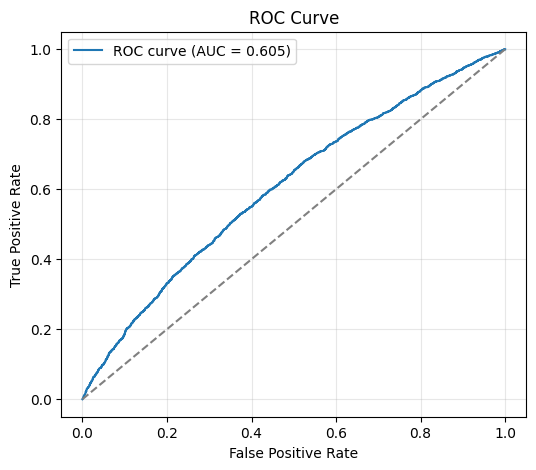

In [ ]:
fpr, tpr, thresholds = roc_curve(y_test, y_proba)

plt.figure(figsize=(6, 5))
plt.plot(fpr, tpr, label=f"ROC curve (AUC = {roc_auc:.3f})")
plt.plot([0, 1], [0, 1], linestyle="--", color="gray")
plt.xlabel("False Positive Rate")
plt.ylabel("True Positive Rate")
plt.title("ROC Curve")
plt.legend()
plt.grid(alpha=0.3)
plt.show()

In [ ]:
import pandas as pd
import numpy as np
from sklearn.model_selection import train_test_split, GridSearchCV, RandomizedSearchCV, cross_val_score, StratifiedKFold
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import f1_score, roc_auc_score, classification_report, confusion_matrix, roc_curve
from sklearn.preprocessing import StandardScaler
from sklearn.pipeline import Pipeline
from sklearn.utils import resample
from imblearn.over_sampling import SMOTE, RandomOverSampler
from imblearn.pipeline import Pipeline as ImbPipeline
import matplotlib.pyplot as plt
import warnings
warnings.filterwarnings('ignore')


df_updated["no_show_bin"] = df_updated[target_class].map({"no": 0, "yes": 1})

# Разделение на признаки и целевую переменную
X = df_updated[predictors]
y = df_updated["no_show_bin"]

# Разделение на train и test
X_train, X_test, y_train, y_test = train_test_split(
    X, y, test_size=0.2, random_state=42, stratify=y
)


print("РАСПРЕДЕЛЕНИЕ КЛАССОВ")

print(f"Train set - Class 0: {(y_train == 0).sum()}, Class 1: {(y_train == 1).sum()}")
print(f"Test set - Class 0: {(y_test == 0).sum()}, Class 1: {(y_test == 1).sum()}")


# 2. ВАРИАНТ 1: Простой Upsampling + GridSearchCV
def simple_upsample(X_train, y_train, random_state=42):

    df_train = pd.DataFrame(X_train)
    df_train['target'] = y_train.values

    df_majority = df_train[df_train['target'] == 0]
    df_minority = df_train[df_train['target'] == 1]

    # Upsampling меньшинства
    df_minority_upsampled = resample(
        df_minority,
        replace=True,
        n_samples=len(df_majority),
        random_state=random_state
    )

    df_balanced = pd.concat([df_majority, df_minority_upsampled])
    df_balanced = df_balanced.sample(frac=1, random_state=random_state).reset_index(drop=True)

    X_balanced = df_balanced.drop('target', axis=1).values
    y_balanced = df_balanced['target'].values

    return X_balanced, y_balanced
X_train_balanced, y_train_balanced = simple_upsample(X_train, y_train)

param_grid = {
    'C': [0.01, 0.1, 1],  # Только ключевые значения
    'penalty': ['l2'],      # Только l2 для скорости
    'solver': ['saga'],     # Один самый быстрый солвер
    'max_iter': [500]       # Меньше итераций
}

log_reg = LogisticRegression(random_state=42, warm_start=False)

cv = StratifiedKFold(n_splits=3, shuffle=True, random_state=42)

grid_search = GridSearchCV(
    log_reg,
    param_grid,
    cv=cv,
    scoring='precision',
    n_jobs=-1,           # Используем все ядра
    verbose=1,
    pre_dispatch='2*n_jobs',  # Оптимизация параллелизации
    error_score='raise'
)


# Обучение
grid_search.fit(X_train_balanced, y_train_balanced)

print(f"\nЛучшие параметры: {grid_search.best_params_}")
print(f"Лучший F1-score (CV): {grid_search.best_score_:.4f}")

# Предсказания
y_pred = grid_search.predict(X_test.values if hasattr(X_test, 'values') else X_test)
y_proba = grid_search.predict_proba(X_test.values if hasattr(X_test, 'values') else X_test)[:, 1]

# Метрики
f1 = f1_score(y_test.values if hasattr(y_test, 'values') else y_test, y_pred)
roc_auc = roc_auc_score(y_test.values if hasattr(y_test, 'values') else y_test, y_proba)

print(f"\nРезультаты на тестовой выборке:")
print(f"F1-score: {f1:.4f}")
print(f"ROC-AUC: {roc_auc:.4f}")
print(f"\nClassification Report:")
print(classification_report(y_test.values if hasattr(y_test, 'values') else y_test, y_pred))

РАСПРЕДЕЛЕНИЕ КЛАССОВ
Train set - Class 0: 24121, Class 1: 3241
Test set - Class 0: 6031, Class 1: 810
Fitting 3 folds for each of 3 candidates, totalling 9 fits

Лучшие параметры: {'C': 0.01, 'max_iter': 500, 'penalty': 'l2', 'solver': 'saga'}
Лучший F1-score (CV): 0.5738

Результаты на тестовой выборке:
F1-score: 0.2437
ROC-AUC: 0.5963

Classification Report:
              precision    recall  f1-score   support

           0       0.91      0.57      0.70      6031
           1       0.15      0.58      0.24       810

    accuracy                           0.57      6841
   macro avg       0.53      0.58      0.47      6841
weighted avg       0.82      0.57      0.65      6841



ВАРИАНТ 2: SMOTE + Pipeline + RandomizedSearchCV
Fitting 5 folds for each of 10 candidates, totalling 50 fits

Лучшие параметры: {'smote__sampling_strategy': 1.0, 'smote__k_neighbors': 3, 'classifier__solver': 'saga', 'classifier__penalty': 'l2', 'classifier__class_weight': 'balanced', 'classifier__C': 0.001}
Лучший F1-score (CV): 0.2390

Результаты на тестовой выборке:
F1-score: 0.2448
ROC-AUC: 0.5955

Classification Report:
              precision    recall  f1-score   support

           0       0.91      0.58      0.71      6031
           1       0.16      0.58      0.24       810

    accuracy                           0.58      6841
   macro avg       0.53      0.58      0.48      6841
weighted avg       0.82      0.58      0.65      6841



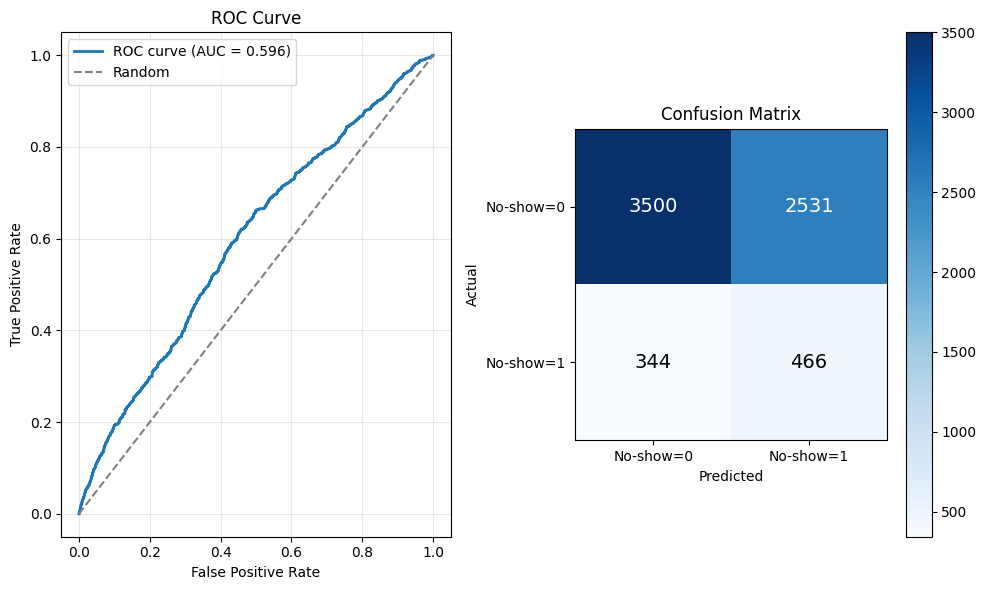

In [ ]:


print("ВАРИАНТ 2: SMOTE + Pipeline + RandomizedSearchCV")

# Создаем pipeline с масштабированием, SMOTE и логистической регрессией
pipeline = ImbPipeline([
    ('scaler', StandardScaler()),
    ('smote', SMOTE(random_state=42)),
    ('classifier', LogisticRegression(random_state=42, max_iter=2000))
])

param_distributions = {
    'classifier__C': [0.001, 0.01, 0.1],
    'classifier__penalty': ['l1', 'l2', 'elasticnet'],
    'classifier__solver': ['liblinear', 'saga'],
    'classifier__class_weight': [ 'balanced'],
    'smote__k_neighbors': [3, 5, 7],
    'smote__sampling_strategy': [0.5, 0.75, 1.0]
}

# RandomizedSearchCV (
random_search = RandomizedSearchCV(
    pipeline,
    param_distributions,
    n_iter=10,  # Количество итераций
    cv=StratifiedKFold(n_splits=5, shuffle=True, random_state=42),
    scoring='f1',
    n_jobs=-1,
    random_state=42,
    verbose=1
)

random_search.fit(X_train, y_train)

print(f"\nЛучшие параметры: {random_search.best_params_}")
print(f"Лучший F1-score (CV): {random_search.best_score_:.4f}")

y_pred_smote = random_search.predict(X_test)
y_proba_smote = random_search.predict_proba(X_test)[:, 1]


f1_smote = f1_score(y_test, y_pred_smote)
roc_auc_smote = roc_auc_score(y_test, y_proba_smote)

print(f"\nРезультаты на тестовой выборке:")
print(f"F1-score: {f1_smote:.4f}")
print(f"ROC-AUC: {roc_auc_smote:.4f}")
print(f"\nClassification Report:")
print(classification_report(y_test, y_pred_smote))

#ВИЗУАЛИЗАЦИЯ РЕЗУЛЬТАТОВ

# ROC-кривые для лучшей модели
best_model = random_search.best_estimator_
y_proba_best = best_model.predict_proba(X_test)[:, 1]

fpr, tpr, thresholds = roc_curve(y_test, y_proba_best)

plt.figure(figsize=(10, 6))

# ROC-кривая
plt.subplot(1, 2, 1)
plt.plot(fpr, tpr, label=f'ROC curve (AUC = {roc_auc_smote:.3f})', linewidth=2)
plt.plot([0, 1], [0, 1], linestyle='--', color='gray', label='Random')
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('ROC Curve')
plt.legend()
plt.grid(alpha=0.3)

# Confusion Matrix
plt.subplot(1, 2, 2)
cm = confusion_matrix(y_test, y_pred_smote)
plt.imshow(cm, cmap='Blues', interpolation='nearest')
plt.colorbar()
plt.title('Confusion Matrix')
plt.xlabel('Predicted')
plt.ylabel('Actual')
plt.xticks([0, 1], ['No-show=0', 'No-show=1'])
plt.yticks([0, 1], ['No-show=0', 'No-show=1'])

for i in range(2):
    for j in range(2):
        plt.text(j, i, str(cm[i, j]), ha='center', va='center',
                color='white' if cm[i, j] > cm.max()/2 else 'black', fontsize=14)

plt.tight_layout()
plt.show()





### RF (just foR Fun)

In [ ]:
X = df_updated[predictors]
y = df_updated["no_show_bin"]

X_train, X_test, y_train, y_test = train_test_split(
    X, y, test_size=0.2, random_state=42, stratify=y
)

clf = RandomForestClassifier(
    n_estimators=700,
    max_depth=10,
    random_state=42,
    min_samples_split=10,min_samples_leaf=4,
    class_weight="balanced_subsample"
)
clf.fit(X_train, y_train)

y_pred = clf.predict(X_test)
y_proba = clf.predict_proba(X_test)[:, 1]

In [ ]:
from sklearn.metrics import accuracy_score

f1 = f1_score(y_test, y_pred)
roc_auc = roc_auc_score(y_test, y_proba)
acc=accuracy_score(y_test,y_pred)
print("acc: ",acc)
print("F1 score:", round(f1, 4))
print("ROC-AUC:", round(roc_auc, 4))

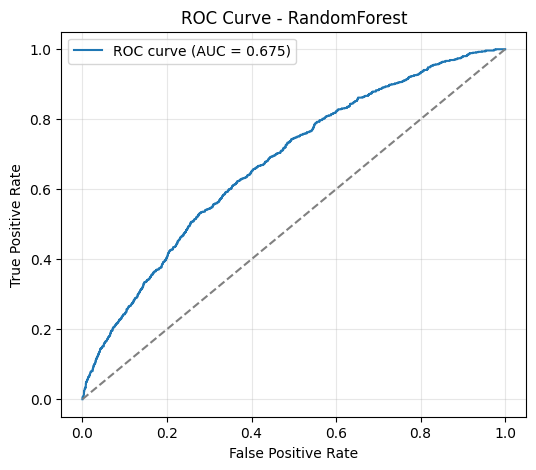

In [ ]:
fpr, tpr, thresholds = roc_curve(y_test, y_proba)

plt.figure(figsize=(6, 5))
plt.plot(fpr, tpr, label=f"ROC curve (AUC = {roc_auc:.3f})")
plt.plot([0, 1], [0, 1], linestyle="--", color="gray")
plt.xlabel("False Positive Rate")
plt.ylabel("True Positive Rate")
plt.title("ROC Curve - RandomForest")
plt.legend()
plt.grid(alpha=0.3)
plt.show()

In [ ]:
print("Размеры до undersampling:")
print(f"Train set - Class 0: {sum(y_train == 0)}, Class 1: {sum(y_train == 1)}")
print(f"Test set - Class 0: {sum(y_test == 0)}, Class 1: {sum(y_test == 1)}")
from imblearn.under_sampling import RandomUnderSampler

rus = RandomUnderSampler(sampling_strategy=0.5, random_state=42)
# 0.5 означает, что после сэмплирования класс 1 будет составлять половину от класса 0
X_train_resampled, y_train_resampled = rus.fit_resample(X_train, y_train)

print("\nРазмеры после undersampling:")
print(f"Train set - Class 0: {sum(y_train_resampled == 0)}, Class 1: {sum(y_train_resampled == 1)}")
print(f"Ratio Class1:Class0 = {sum(y_train_resampled == 1) / sum(y_train_resampled == 0):.2f}")


In [ ]:
clf = RandomForestClassifier(
    n_estimators=700,
    max_depth=10,
    random_state=42,
    min_samples_split=10,
    min_samples_leaf=4,
    class_weight="balanced_subsample",
    n_jobs=-1
)

clf.fit(X_train_resampled, y_train_resampled)

# Предсказания
y_pred = clf.predict(X_test)
y_proba = clf.predict_proba(X_test)[:, 1]

# Метрики
f1 = f1_score(y_test, y_pred)
roc_auc = roc_auc_score(y_test, y_proba)

In [ ]:
acc=accuracy_score(y_test,y_pred)
print("acc: ",acc)
print("F1 score:", round(f1, 4))
print("ROC-AUC:", round(roc_auc, 4))

In [ ]:
fpr, tpr, thresholds = roc_curve(y_test, y_proba)

plt.figure(figsize=(6, 5))
plt.plot(fpr, tpr, label=f"ROC curve (AUC = {roc_auc:.3f})")
plt.plot([0, 1], [0, 1], linestyle="--", color="gray")
plt.xlabel("False Positive Rate")
plt.ylabel("True Positive Rate")
plt.title("ROC Curve - RandomForest")
plt.legend()
plt.grid(alpha=0.3)
plt.show()